# Pancreas

In [1]:
%load_ext autoreload
%load_ext autotime

import os
import glob
import random
import sys
import math
# import from absolute directory
srcdir = '/Users/pengzhizhang/cellDancer/src'
sys.path.append(srcdir)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


time: 792 ms (started: 2022-05-13 17:37:20 -05:00)


In [2]:
import celldancer.cdplt as cdplt
from celldancer.cdplt import colormap
from celldancer import velocity_estimation
from celldancer.compute_cell_velocity import compute_cell_velocity
from celldancer.pseudo_time import pseudo_time

time: 2.77 s (started: 2022-05-13 17:37:21 -05:00)


## Set Parameters

In [140]:
n_neighbors=200
downsample_step=(100,100)

time: 1.64 ms (started: 2022-05-17 16:13:22 -05:00)


## Load detail

In [4]:
detail_result_path = '/Users/pengzhizhang/pseudotime/data/pancreas/velocity_result'
output_path = os.getcwd()
detail_file = os.path.join(detail_result_path,'combined_detail.csv')
load_cellDancer=pd.read_csv(detail_file)

time: 9.14 s (started: 2022-05-13 17:37:29 -05:00)


## Visualize gene velocity

In [5]:
xlim = (-15, 15)
ylim = (-10, 10)

time: 1.35 ms (started: 2022-05-13 17:37:38 -05:00)


In [141]:
%autoreload 2

gene_choice=list(set(load_cellDancer.gene_name))
load_cellDancer = compute_cell_velocity(
    load_cellDancer=load_cellDancer,
    gene_list=gene_choice,
    mode="embedding",
    transfer_mode=None,
    n_neighbors=n_neighbors,
    step=downsample_step)

(genes, cells): (2000, 3696)
Caution! Overwriting the 'velocity' columns.
After downsampling, there are  1529 cells.
time: 44.5 s (started: 2022-05-17 16:13:36 -05:00)


In [132]:
load_cellDancer

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,cost,clusters,cellID,embedding1,embedding2,pseudotime,alpha_beta_gamma_umap1,alpha_beta_gamma_umap2,velocity1,velocity2
0,0,2010107G23Rik,0.645871,0.000000,0.631752,0.000444,0.004090,0.033074,0.143236,0.085577,Pre-endocrine,AAACCTGAGAGGGATA,6.143066,-0.063644,0.858311,8.922098,13.129356,NaN,NaN
1,1,2010107G23Rik,0.659958,0.050844,0.667935,0.049499,0.002315,0.013641,0.159593,0.085577,Ductal,AAACCTGAGCCTTGAT,-9.906417,0.197778,0.173225,12.970846,-3.634279,NaN,NaN
2,2,2010107G23Rik,0.536477,0.031027,0.543241,0.030047,0.002852,0.018068,0.154822,0.085577,Alpha,AAACCTGAGGCAATTA,7.559791,0.583762,0.888974,6.813724,15.566797,0.012397,0.330044
3,3,2010107G23Rik,0.172749,0.000000,0.168829,0.000422,0.003884,0.025258,0.148675,0.085577,Ductal,AAACCTGCATCATCCC,-11.283765,4.218998,0.047561,5.904807,-4.386752,-0.056209,0.089579
4,4,2010107G23Rik,2.669759,0.024144,2.671663,0.020978,0.003705,0.064247,0.127344,0.085577,Ngn3 high EP,AAACCTGGTAAGTGGC,1.721565,-4.753407,0.563299,13.156005,8.326236,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7391995,3691,Zfp949,0.175796,0.175190,0.163429,0.174457,0.209083,0.203498,0.271190,0.043265,Pre-endocrine,TTTGTCAAGTGACATA,4.768472,-1.388353,0.798697,9.121659,12.999917,NaN,NaN
7391996,3692,Zfp949,0.078194,0.130215,0.086273,0.142232,0.216891,0.203658,0.268408,0.043265,Ngn3 high EP,TTTGTCAAGTGTGGCA,-1.873335,-4.182650,0.416080,12.814433,4.767254,0.313766,-0.170953
7391997,3693,Zfp949,0.000000,0.044002,0.011225,0.076212,0.210932,0.204190,0.266029,0.043265,Ductal,TTTGTCAGTTGTTTGG,-9.882250,-0.105594,0.180827,9.807837,-4.607297,NaN,NaN
7391998,3694,Zfp949,0.041343,0.086365,0.050158,0.108793,0.214619,0.203931,0.267263,0.043265,Alpha,TTTGTCATCGAATGCT,6.612424,4.531895,0.996953,4.989841,17.349808,NaN,NaN


time: 17.1 ms (started: 2022-05-17 15:56:06 -05:00)


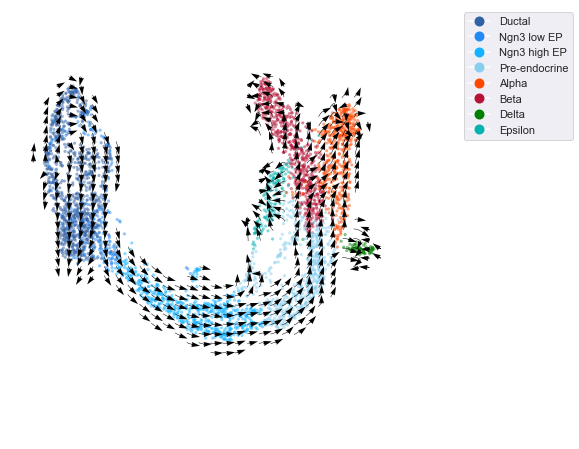

time: 3.47 s (started: 2022-05-17 16:15:55 -05:00)


In [142]:
%autoreload 2

fig, ax = plt.subplots(figsize=(8,8))
im = cdplt.cell.scatter_cell(ax,load_cellDancer, colors=colormap.colormap_pancreas, alpha=0.5, s=10,
             gene_name=None, velocity=True, custom_xlim=xlim, custom_ylim=ylim, legend='on')
ax.axis('off')
plt.show()

In [16]:
%%script echo skipping for now
gene_list=['Dcx','Rimbp2','Dctn3','Psd3','Ntrk2',
           'Pfkp','Gnao1','Ncald','Klf7','Slc4a10',
           'Nav1','Elavl4','Gpc6','Cdh13','Ppfia2']


ncols=5
fig = plt.figure(figsize=(20,12))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])
    ax.axis('off')

plt.show()

skipping for now
time: 38.8 ms (started: 2022-05-05 17:16:51 -05:00)


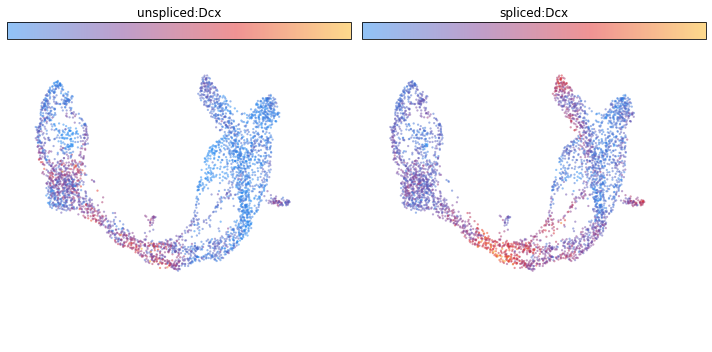

time: 1.56 s (started: 2022-05-09 11:00:48 -05:00)


In [9]:
%autoreload 2

fig, ax = plt.subplots(ncols=2, figsize=(10,5))
gene = 'Dcx'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='unspliced', 
             gene_name=gene, velocity=False, custom_xlim=xlim, custom_ylim=ylim, colorbar='on')
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='spliced', 
             gene_name=gene, velocity=False, custom_xlim=xlim, custom_ylim=ylim, colorbar='on')

ax[0].axis('off')
ax[1].axis('off')
ax[0].set_title('unspliced:'+gene)
ax[1].set_title('spliced:'+gene)
plt.tight_layout()
plt.show()

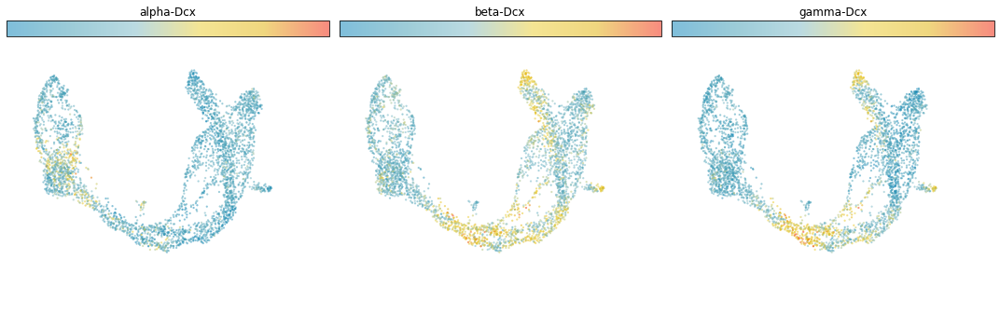

time: 2.2 s (started: 2022-05-09 11:00:54 -05:00)


In [10]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5))
gene = 'Dcx'
im0=cdplt.cell.scatter_cell(ax[0],load_cellDancer, colors='alpha', 
             gene_name=gene, velocity=False, custom_xlim=xlim, custom_ylim=ylim)
im1=cdplt.cell.scatter_cell(ax[1],load_cellDancer, colors='beta', 
             gene_name=gene, velocity=False, custom_xlim=xlim, custom_ylim=ylim)
im2=cdplt.cell.scatter_cell(ax[2],load_cellDancer, colors='gamma', 
             gene_name=gene, velocity=False, custom_xlim=xlim, custom_ylim=ylim)
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].set_title('alpha-'+gene)
ax[1].set_title('beta-'+gene)
ax[2].set_title('gamma-'+gene)
plt.tight_layout()
plt.show()

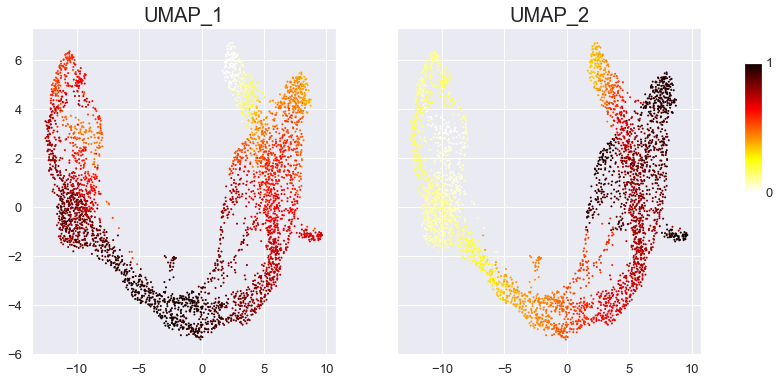

time: 284 ms (started: 2022-05-16 12:51:52 -05:00)


In [65]:

fig, axes = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)

im1=axes[0].scatter(x=embedding[:,0], y=embedding[:,1], 
                    c=normalized_abr_umap[:,0], cmap='hot_r', alpha=1, vmin=0, vmax=1, s=1)

im2=axes[1].scatter(x=embedding[:,0], y=embedding[:,1], 
                    c=normalized_abr_umap[:,1], cmap='hot_r', alpha=1, vmin=0, vmax=1, s=1)

axes[0].tick_params(axis='x', labelsize=13)
axes[0].tick_params(axis='y', labelsize=13)
axes[1].tick_params(axis='x', labelsize=13)
axes[1].tick_params(axis='y', labelsize=13)


cax = plt.axes([0.95, 0.5, 0.02, 0.3])
cbar = fig.colorbar(im2, cax=cax, ticks=[0,1])

axes[0].set_title("UMAP_1", fontdict = {'size':20})
axes[1].set_title("UMAP_2", fontdict = {'size':20})

cax.tick_params(axis='y', labelsize=13, size=0)
cax.set_yticklabels(['0', '1'])

#plt.savefig("umap_on_embedding.pdf")
plt.show()

In [54]:
%autoreload 2
from celldancer.diffusion import embedding_normalization, velocity_normalization, generate_grid, compute_path_divider_matrix

gene_choice = load_cellDancer[~load_cellDancer['velocity1'].isna()]['gene_name']
gene_choice = gene_choice.drop_duplicates()
one_gene = gene_choice.to_list()[0]
embedding = load_cellDancer[load_cellDancer['gene_name'] ==
        one_gene][['embedding1', 'embedding2']]
embedding = embedding.to_numpy()

# This could be problematic if it's not in the gene_choice
velocity_embedding = load_cellDancer[load_cellDancer.gene_name ==
        one_gene][['velocity1', 'velocity2']].dropna()
sampling_ixs = velocity_embedding.index

cell_embedding, normalized_embedding = embedding_normalization(
    embedding[sampling_ixs], embedding, mode='minmax', NORM_ALL_CELLS=True)
velocity = velocity_normalization(velocity_embedding, mode='max')

abr_umap = load_cellDancer[load_cellDancer['gene_name'] ==
                one_gene][['alpha_beta_gamma_umap1', 'alpha_beta_gamma_umap2']]
_, normalized_abr_umap = embedding_normalization(
                abr_umap.loc[sampling_ixs], abr_umap, mode='minmax', NORM_ALL_CELLS=True)


__ = generate_grid(cell_embedding, normalized_embedding,
        velocity, normalized_abr_umap, steps=grid)

vel_mesh = __[0]
grid_mass = __[1]
grid_umap = __[2]
cell_grid_idx = __[3]
cell_grid_coor = __[4]
all_grid_idx = __[5]
all_grid_coor = __[6]


fmat = grid_umap
ngrids = fmat.shape[:-1]
flat_length = np.multiply(*ngrids)
temp = fmat.reshape(flat_length, fmat.shape[-1])

temp2 = temp-temp[:,None]
temp2 = np.linalg.norm(temp2, axis=-1)


#path_divider_matrix = compute_path_divider_matrix(grid_umap, cutoff=0.1)

time: 1.24 s (started: 2022-05-16 12:24:56 -05:00)


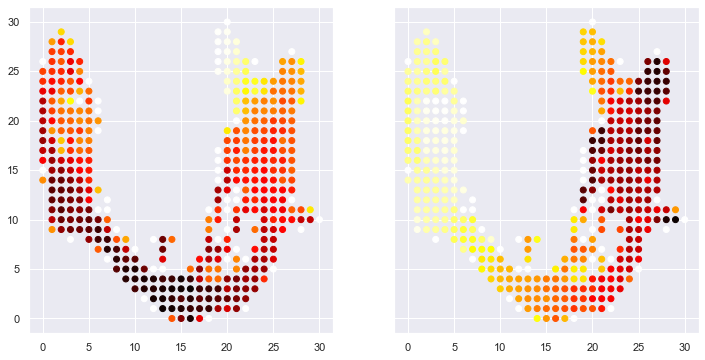

time: 235 ms (started: 2022-05-16 12:35:02 -05:00)


In [60]:
import matplotlib.pylab as plt

fig, axes = plt.subplots(ncols=2, figsize=(12, 6), sharey=True)


x=list()
y=list()
vx=list()
vy=list()
for i in range(grid_umap.shape[0]):
    for j in range(grid_umap.shape[1]):
        x.append(i)
        y.append(j)
        vx.append(grid_umap[i,j][0])
        vy.append(grid_umap[i,j][1])
axes[0].scatter(x,y, c=vx, cmap='hot_r')
axes[1].scatter(x,y, c=vy, cmap='hot_r')

plt.show()

## Estimate pseudotime

Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15290/15290 [04:22<00:00, 58.33it/s]


Those path clusters are removed:  {8, 2, 6, 7}
There are 5 clusters.
[0 1 3 4 5]


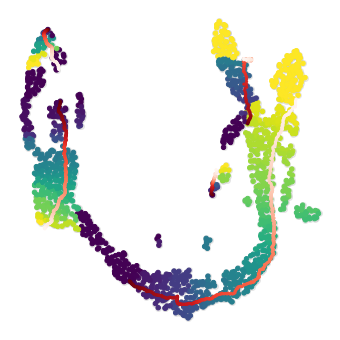




Cluster  0
Total cells in the cluster:  891
MAX allowed zero time cells:  44
MAX allowed terminal cells:  44
114  zero cells left.
Sample trajs for zero-time cells in cluster  0   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1140/1140 [00:10<00:00, 109.59it/s]





Cluster  0
Total cells in the cluster:  114
MAX allowed zero time cells:  44
MAX allowed terminal cells:  44
Only  3  zero cells left. 
[69, 669, 879]
Only  5  terminal cells left.
[25, 484, 1043, 1124, 1383]
94  terminal cells left.
Sample trajs for terminal cells in cluster  0  ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 940/940 [01:15<00:00, 12.38it/s]





Cluster  0
Total cells in the cluster:  94
MAX allowed zero time cells:  44
MAX allowed terminal cells:  44
Only  4  zero cells left. 
[3, 517, 791, 1084]
Only  4  terminal cells left.
[645, 760, 1018, 1420]
number of paths:  3 3

Display reference paths for cluster 0


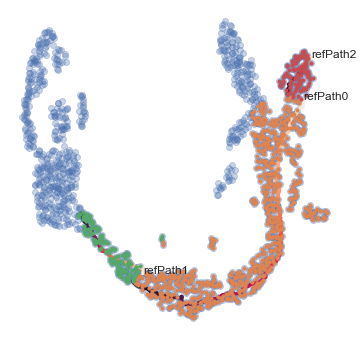


intercluster cell time adjustment
number of cells:  891
Cutoff is  0.05077302901111984
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (1085, 25)
pair_cellIDs:  (1235, 484)
pair_cellIDs:  (1179, 1383)
pair_cellIDs:  (978, 1043)
pair_cellIDs:  (686, 1124)
pair_cellIDs:  (412, 1051)
pair_cellIDs:  (955, 921)
pair_cellIDs:  (1496, 948)
pair_cellIDs:  (247, 260)
pair_cellIDs:  (1423, 1100)
pair_cellIDs:  (685, 1064)
pair_cellIDs:  (653, 993)
pair_cellIDs:  (704, 28)
pair_cellIDs:  (252, 1262)
pair_cellIDs:  (1098, 842)
pair_cellIDs:  (1283, 411)

Peak mode:  most_frequent_shift


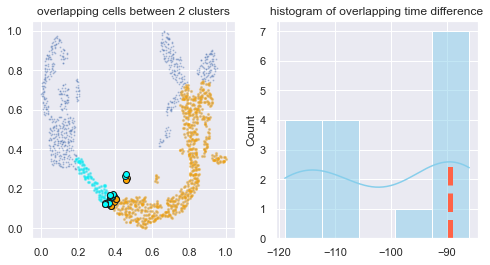

Time shift is:  -89
The overlapping cells are: 
cell  252  from cluster  0  and  1262  from cluster  1

Consolidating time between clusters  0  and  2 ...
pair_cellIDs:  (1428, 517)
pair_cellIDs:  (615, 791)
pair_cellIDs:  (828, 1084)
pair_cellIDs:  (1295, 3)
pair_cellIDs:  (800, 84)
pair_cellIDs:  (1080, 938)
pair_cellIDs:  (1318, 1349)
pair_cellIDs:  (862, 1112)

Peak mode:  most_frequent_shift


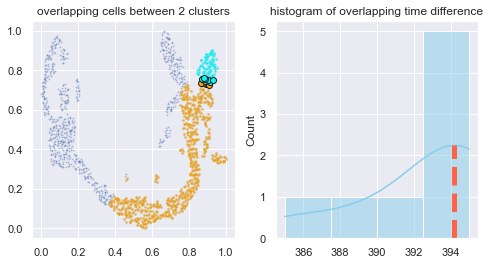

Time shift is:  395
The overlapping cells are: 
cell  1428  from cluster  0  and  517  from cluster  2

Consolidating time between clusters  1  and  2 ...
No close cells between clusters	 (1, 2)


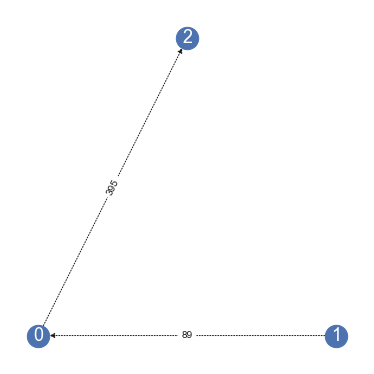

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: -89, 2: 395}



Cluster  1
Total cells in the cluster:  403
MAX allowed zero time cells:  20
MAX allowed terminal cells:  20
Only  2  terminal cells left.
[58, 1299]
60  zero cells left.
Sample trajs for zero-time cells in cluster  1   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 600/600 [00:12<00:00, 48.04it/s]





Cluster  1
Total cells in the cluster:  60
MAX allowed zero time cells:  20
MAX allowed terminal cells:  20
Only  3  zero cells left. 
[68, 1298, 1303]
Only  9  terminal cells left.
[219, 393, 424, 520, 751, 990, 1013, 1101, 1111]
number of paths:  2 2

Display reference paths for cluster 1


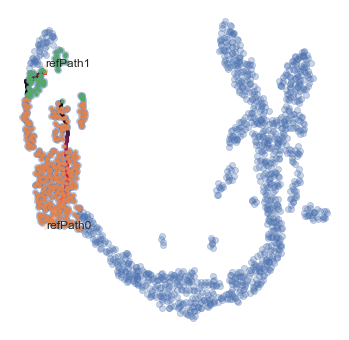


intercluster cell time adjustment
number of cells:  403
Cutoff is  0.03313912201461678
Number of nodes:  2
clusterIDs:  [0, 1]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (687, 1303)
pair_cellIDs:  (603, 962)
pair_cellIDs:  (1429, 1056)
pair_cellIDs:  (864, 68)
pair_cellIDs:  (622, 401)
pair_cellIDs:  (386, 1110)
pair_cellIDs:  (678, 503)
pair_cellIDs:  (370, 1061)

Peak mode:  most_frequent_shift


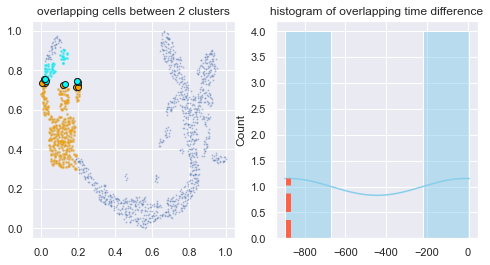

Time shift is:  -895
The overlapping cells are: 
cell  1429  from cluster  0  and  1056  from cluster  1


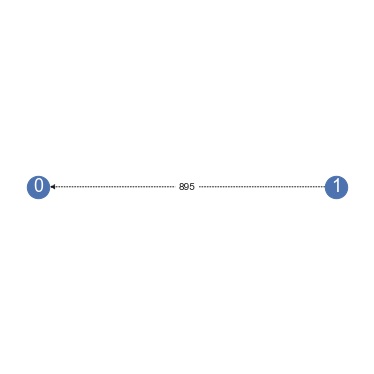

Connected components:  {0, 1}
All nodes adjustment:  {0: 0, 1: -895}



Cluster  3
Total cells in the cluster:  168
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
29  zero cells left.
Sample trajs for zero-time cells in cluster  3   ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 290/290 [00:25<00:00, 11.42it/s]





Cluster  3
Total cells in the cluster:  29
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  2  zero cells left. 
[419, 1391]
Only  1  terminal cells left.
[1019]
51  terminal cells left.
Sample trajs for terminal cells in cluster  3  ...
Pseudo random numbers seeds are:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 510/510 [00:11<00:00, 45.17it/s]





Cluster  3
Total cells in the cluster:  51
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  3  zero cells left. 
[1225, 1238, 1387]
Only  1  terminal cells left.
[1003]
number of paths:  3 3

Display reference paths for cluster 3


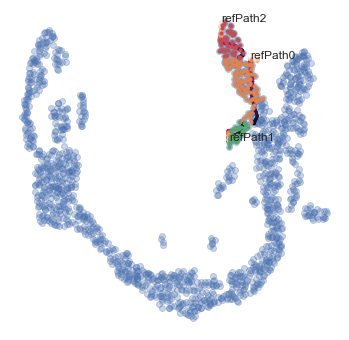


intercluster cell time adjustment
number of cells:  168
Cutoff is  0.017511512956972963
Number of nodes:  3
clusterIDs:  [0, 1, 2]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (27, 1432)
pair_cellIDs:  (1191, 419)

Peak mode:  least_shift


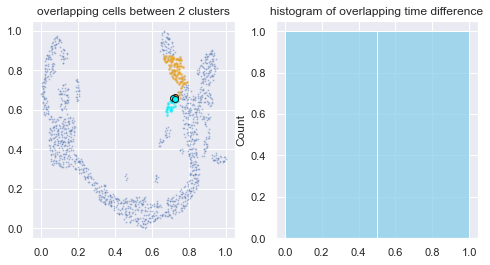

Time shift is:  0
The overlapping cells are: 
cell  27  from cluster  0  and  1432  from cluster  1

Consolidating time between clusters  0  and  2 ...
pair_cellIDs:  (195, 1225)
pair_cellIDs:  (1518, 178)
pair_cellIDs:  (590, 1387)
pair_cellIDs:  (1280, 1238)
pair_cellIDs:  (100, 927)

Peak mode:  most_frequent_shift


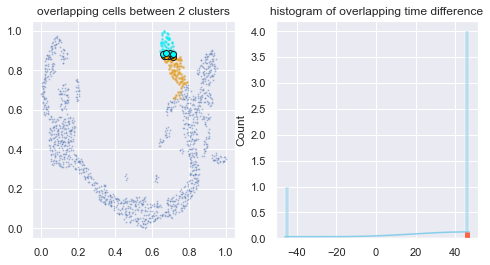

Time shift is:  47
The overlapping cells are: 
cell  195  from cluster  0  and  1225  from cluster  2

Consolidating time between clusters  1  and  2 ...
No close cells between clusters	 (1, 2)


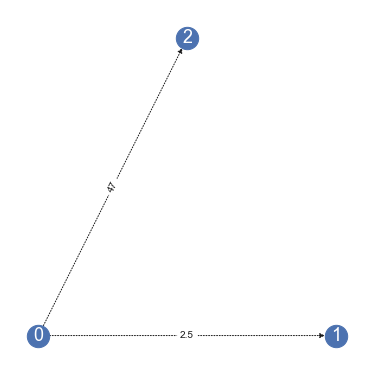

Connected components:  {0, 1, 2}
All nodes adjustment:  {0: 0, 1: 0, 2: 47}



Cluster  4
Total cells in the cluster:  46
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  1  zero cells left. 
[469]
Only  9  terminal cells left.
[112, 382, 435, 716, 768, 1213, 1222, 1253, 1416]
number of paths:  1 1

Display reference paths for cluster 4


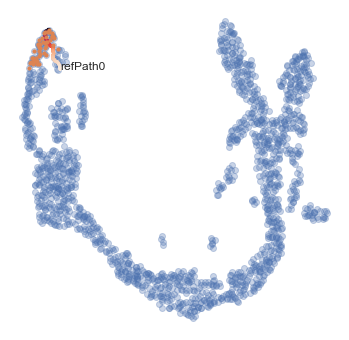




Cluster  5
Total cells in the cluster:  21
MAX allowed zero time cells:  10
MAX allowed terminal cells:  10
Only  2  zero cells left. 
[125, 1414]
Only  2  terminal cells left.
[194, 666]
number of paths:  1 1

Display reference paths for cluster 5


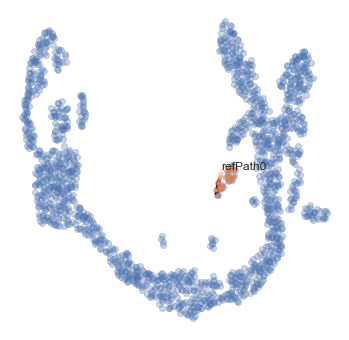




All intra cluster cell time has been resolved.




intercluster cell time adjustment
number of cells:  1529
Cutoff is  0.05923716404415605
Number of nodes:  5
clusterIDs:  [0, 1, 3, 4, 5]

Consolidating time between clusters  0  and  1 ...
pair_cellIDs:  (669, 557)
pair_cellIDs:  (581, 1355)
pair_cellIDs:  (551, 448)
pair_cellIDs:  (1198, 1339)
pair_cellIDs:  (69, 663)
pair_cellIDs:  (1125, 914)
pair_cellIDs:  (879, 1228)
pair_cellIDs:  (40, 1268)
pair_cellIDs:  (1086, 977)
pair_cellIDs:  (1511, 1453)
pair_cellIDs:  (189, 629)
pair_cellIDs:  (1242, 1347)
pair_cellIDs:  (1452, 679)

Peak mode:  most_frequent_shift


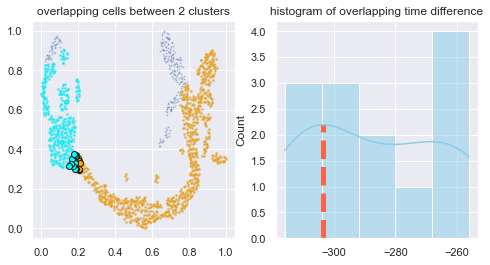

Time shift is:  -304
The overlapping cells are: 
cell  40  from cluster  0  and  1268  from cluster  1

Consolidating time between clusters  0  and  3 ...
pair_cellIDs:  (182, 341)
pair_cellIDs:  (1515, 724)
pair_cellIDs:  (1444, 188)
pair_cellIDs:  (769, 1001)
pair_cellIDs:  (884, 1277)
pair_cellIDs:  (963, 1036)
pair_cellIDs:  (984, 841)
pair_cellIDs:  (1474, 446)
pair_cellIDs:  (1470, 1358)
pair_cellIDs:  (105, 597)
pair_cellIDs:  (1314, 1088)
pair_cellIDs:  (1412, 1391)
pair_cellIDs:  (1434, 975)
pair_cellIDs:  (183, 1192)
pair_cellIDs:  (237, 419)
pair_cellIDs:  (556, 1087)
pair_cellIDs:  (488, 1491)
pair_cellIDs:  (102, 164)
pair_cellIDs:  (244, 713)
pair_cellIDs:  (236, 1191)
pair_cellIDs:  (624, 1506)
pair_cellIDs:  (721, 258)
pair_cellIDs:  (599, 55)
pair_cellIDs:  (1326, 27)

Peak mode:  most_frequent_shift


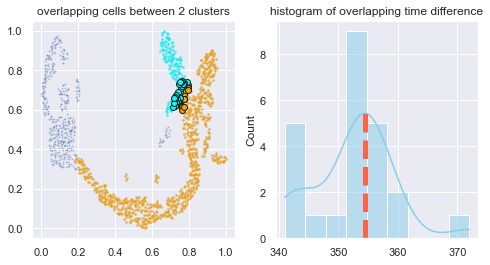

Time shift is:  354
The overlapping cells are: 
cell  884  from cluster  0  and  1277  from cluster  3

Consolidating time between clusters  0  and  4 ...
No close cells between clusters	 (0, 4)

Consolidating time between clusters  0  and  5 ...
No close cells between clusters	 (0, 5)

Consolidating time between clusters  1  and  3 ...
No close cells between clusters	 (1, 3)

Consolidating time between clusters  1  and  4 ...
pair_cellIDs:  (1013, 1025)
pair_cellIDs:  (1418, 1253)
pair_cellIDs:  (945, 1222)
pair_cellIDs:  (219, 545)
pair_cellIDs:  (385, 1213)
pair_cellIDs:  (537, 768)
pair_cellIDs:  (990, 376)
pair_cellIDs:  (692, 435)
pair_cellIDs:  (1405, 716)
pair_cellIDs:  (946, 1416)
pair_cellIDs:  (424, 1361)
pair_cellIDs:  (520, 505)
pair_cellIDs:  (393, 1300)
pair_cellIDs:  (226, 382)
pair_cellIDs:  (352, 112)
pair_cellIDs:  (158, 1438)
pair_cellIDs:  (493, 554)
pair_cellIDs:  (1101, 1130)

Peak mode:  most_frequent_shift


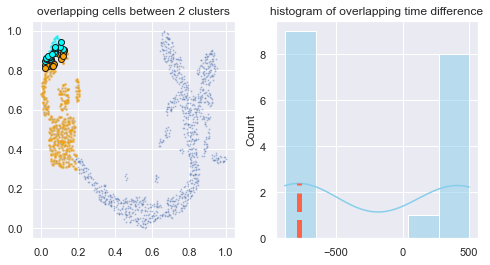

Time shift is:  -779
The overlapping cells are: 
cell  385  from cluster  1  and  1213  from cluster  4

Consolidating time between clusters  1  and  5 ...
No close cells between clusters	 (1, 5)

Consolidating time between clusters  3  and  4 ...
No close cells between clusters	 (3, 4)

Consolidating time between clusters  3  and  5 ...
No close cells between clusters	 (3, 5)

Consolidating time between clusters  4  and  5 ...
No close cells between clusters	 (4, 5)


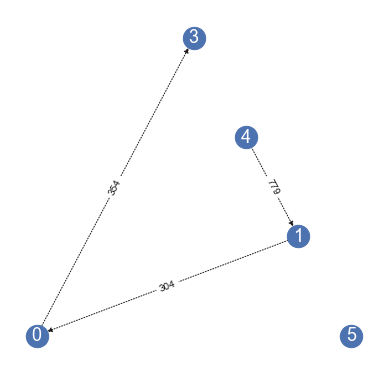

Connected components:  {0, 1, 3, 4}
Connected components:  {5}
All nodes adjustment:  {0: 0, 1: -304, 3: 354, 4: -1083, 5: 0}


All inter cluster cell time has been resolved.



There are 3696 cells.


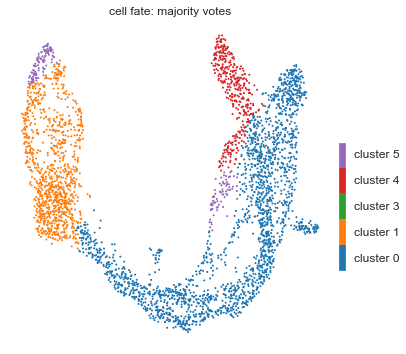

--- 523.0884428024292 seconds ---
time: 8min 43s (started: 2022-05-17 17:01:34 -05:00)


In [147]:
%autoreload 2

cell_time = dict()
dt = 0.01
#t_total = {dt:int(10/dt)} 
t_total = {0.01: 10000}
n_repeats = 10

grid = (40, 40)
load_cellDancer = pseudo_time(
    load_cellDancer=load_cellDancer, 
    grid=grid, 
    dt=dt, 
    t_total=t_total[dt], 
    n_repeats=n_repeats, 
    downsample_step=downsample_step,
    path_similarity = 0.15,
    psrng_seeds_diffusion=[i for i in range(n_repeats)],
    activate_umap_paths_divider=False,
    n_jobs=12)

In [111]:
%%script echo "skipping"
A = nx.Graph()
A.add_edges_from([(0,1),(1,2), (0,2), (1,4), (2,4), (4,5), (2,3)])
nx.cycle_basis(A)
subGs = [G.subgraph(c) for c in nx.cycle_basis(G.to_undirected())]
print(subGs[0].edges)

A = nx.Graph()
A.add_edges_from([(0,1),(1,2), (0,2), (1,4), (2,4), (4,5), (2,3)])
nx.cycle_basis(A)

skipping
time: 54.1 ms (started: 2022-05-17 13:29:40 -05:00)


In [149]:
alpha_time  = load_cellDancer[load_cellDancer.clusters == 'Alpha'][load_cellDancer.gene_name == 'Dcx']['pseudotime']
beta_time = load_cellDancer[load_cellDancer.clusters == 'Beta'][load_cellDancer.gene_name == 'Dcx']['pseudotime']

alpha_time.max(), beta_time.max()

(1.0, 0.9984792946304736)

time: 1.53 s (started: 2022-05-17 18:04:02 -05:00)


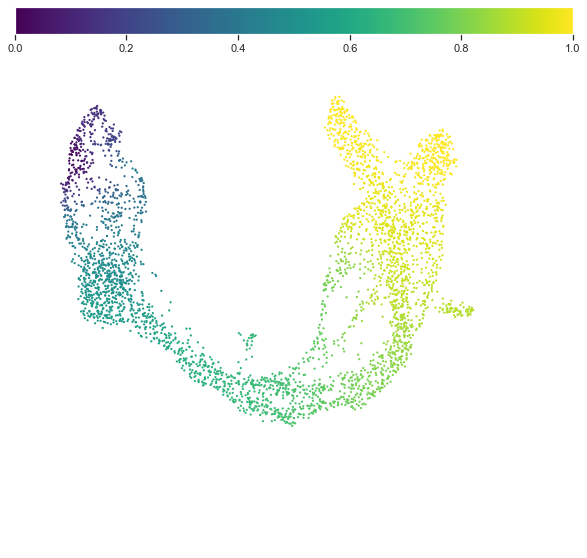

time: 1.49 s (started: 2022-05-17 18:03:57 -05:00)


In [148]:
fig, ax = plt.subplots(figsize=(10,10))
im=cdplt.cell.scatter_cell(ax,load_cellDancer, colors='pseudotime', 
                           alpha=1,
                           gene_name=None, velocity=False,
                           custom_xlim=xlim, custom_ylim=ylim)
ax.axis('off')
plt.show()

In [51]:
cell_clusters = {0: [np.array([0.28728164, 0.19365283]), np.array([0.31263054, 0.17103319]), np.array([0.28967751, 0.2157724 ]), np.array([0.31028122, 0.19032775]), np.array([0.3488172 , 0.14772029]), np.array([0.33736004, 0.15496945]), np.array([0.3317208 , 0.18132186]), np.array([0.31556385, 0.21016076]), np.array([0.36942354, 0.19094754]), np.array([0.36524609, 0.20174194]), np.array([0.32736873, 0.16563294]), np.array([0.36963701, 0.14108737]), np.array([0.38348336, 0.14054121]), np.array([0.40337388, 0.09286761]), np.array([0.40562135, 0.1284646 ]), np.array([0.38113112, 0.15734236]), np.array([0.40420412, 0.08988181]), np.array([0.3506552 , 0.18488231]), np.array([0.18479091, 0.37272146]), np.array([0.39230719, 0.16174124]), np.array([0.40055981, 0.15612155]), np.array([0.35938551, 0.16809457]), np.array([0.35834971, 0.18168833]), np.array([0.41227748, 0.15309874]), np.array([0.42159052, 0.14550719]), np.array([0.19726035, 0.38255496]), np.array([0.41597606, 0.10008836]), np.array([0.34617459, 0.21345578]), np.array([0.18677418, 0.35032505]), np.array([0.28074218, 0.19557682]), np.array([0.42796896, 0.15979841]), np.array([0.19883531, 0.3397084 ]), np.array([0.38693796, 0.17613889]), np.array([0.19549281, 0.31743844]), np.array([0.20769758, 0.32822467]), np.array([0.20676086, 0.3152286 ]), np.array([0.21350887, 0.32952922]), np.array([0.22242339, 0.34251021]), np.array([0.2056861 , 0.28166903]), np.array([0.22787956, 0.32670128]), np.array([0.43231136, 0.15751273]), np.array([0.22426259, 0.30236597]), np.array([0.22768755, 0.28093617]), np.array([0.22678495, 0.28368624]), np.array([0.23273502, 0.28480523]), np.array([0.23704594, 0.25065705]), np.array([0.25028686, 0.25897748]), np.array([0.24930497, 0.24284094]), np.array([0.2549383 , 0.25278286]), np.array([0.25484958, 0.23240091]), np.array([0.26263446, 0.26706197]), np.array([0.26700824, 0.25434002]), np.array([0.26739525, 0.23364008]), np.array([0.27562952, 0.22197432]), np.array([0.29284195, 0.17534269]), np.array([0.29735937, 0.19804061]), np.array([0.73364877, 0.12097025]), np.array([0.29866671, 0.16841867]), np.array([0.70189566, 0.1456509 ]), np.array([0.31274933, 0.15036036]), np.array([0.69425969, 0.16160349]), np.array([0.31573161, 0.14549751]), np.array([0.3160742 , 0.16231863]), np.array([0.70901303, 0.154331  ]), np.array([0.32629299, 0.21386708]), np.array([0.32437765, 0.13645288]), np.array([0.33851441, 0.21315665]), np.array([0.34396305, 0.12272269]), np.array([0.3468013 , 0.13004411]), np.array([0.61314835, 0.0991711 ]), np.array([0.76091492, 0.1828756 ]), np.array([0.37135544, 0.11876412]), np.array([0.80370164, 0.17902392]), np.array([0.62992847, 0.09979287]), np.array([0.6297544 , 0.10042777]), np.array([0.77462059, 0.18766714]), np.array([0.38013018, 0.11110953]), np.array([0.37595232, 0.1302185 ]), np.array([0.64924351, 0.10849129]), np.array([0.65522816, 0.1087245 ]), np.array([0.41016804, 0.07955603]), np.array([0.68311542, 0.14060469]), np.array([0.41431092, 0.08573106]), np.array([0.89936936, 0.40905463]), np.array([0.68761225, 0.11610546]), np.array([0.41922266, 0.07124978]), np.array([0.74584465, 0.11472237]), np.array([0.71000856, 0.11350203]), np.array([0.68005546, 0.12805505]), np.array([0.42965241, 0.05501562]), np.array([0.73277505, 0.11442625]), np.array([0.79925098, 0.23616652]), np.array([0.74373716, 0.11380351]), np.array([0.68233094, 0.14469026]), np.array([0.44237283, 0.05310713]), np.array([0.71339391, 0.14048206]), np.array([0.43565238, 0.10292666]), np.array([0.44724149, 0.03952972]), np.array([0.80817148, 0.24287094]), np.array([0.9097739 , 0.44157157]), np.array([0.45948657, 0.03452637]), np.array([0.44716838, 0.12703447]), np.array([0.73182625, 0.15010962]), np.array([0.45266107, 0.08444002]), np.array([0.45710883, 0.05567238]), np.array([0.8202717 , 0.25858843]), np.array([0.45287775, 0.09610091]), np.array([0.80725156, 0.26051733]), np.array([0.46186767, 0.05177351]), np.array([0.45696218, 0.10561309]), np.array([0.45463321, 0.13902335]), np.array([0.8438999 , 0.25538057]), np.array([0.72789796, 0.16711558]), np.array([0.70573069, 0.16357928]), np.array([0.45894081, 0.15321334]), np.array([0.72771509, 0.15673858]), np.array([0.77889322, 0.13982631]), np.array([0.82797272, 0.48487285]), np.array([0.73684644, 0.16919021]), np.array([0.80534778, 0.27600494]), np.array([0.4686396, 0.0742644]), np.array([0.81771577, 0.48974042]), np.array([0.76314277, 0.16089592]), np.array([0.81560699, 0.49737059]), np.array([0.47415218, 0.0712388 ]), np.array([0.751704  , 0.16314489]), np.array([0.48309327, 0.0338133 ]), np.array([0.79227434, 0.14300809]), np.array([0.48270649, 0.03308932]), np.array([0.75035019, 0.1871195 ]), np.array([0.47250627, 0.12515964]), np.array([0.76433226, 0.15458968]), np.array([0.48029212, 0.06057362]), np.array([0.8532048, 0.275915 ]), np.array([0.47769062, 0.12432795]), np.array([0.83860147, 0.50056616]), np.array([0.47620725, 0.13736844]), np.array([0.48701508, 0.06466247]), np.array([0.4878692 , 0.06558488]), np.array([0.77582025, 0.16375675]), np.array([0.81753284, 0.50534889]), np.array([0.49355738, 0.0585855 ]), np.array([0.78021732, 0.16977718]), np.array([0.825417  , 0.51122571]), np.array([0.48708369, 0.14744875]), np.array([0.82287232, 0.25660866]), np.array([0.49433808, 0.12304303]), np.array([0.82610268, 0.25457968]), np.array([0.17945219, 0.58166856]), np.array([0.51831793, 0.01757487]), np.array([0.49392167, 0.14604829]), np.array([0.51391127, 0.03615102]), np.array([0.83261135, 0.2694558 ]), np.array([0.50771281, 0.07126881]), np.array([0.78694846, 0.66340945]), np.array([0.81790899, 0.18374086]), np.array([0.50876931, 0.09436757]), np.array([0.50794729, 0.12434905]), np.array([0.78064661, 0.66834148]), np.array([0.8395039 , 0.52581861]), np.array([0.53419789, 0.01828608]), np.array([0.51490188, 0.11118553]), np.array([0.54165774, 0.01452653]), np.array([0.52655093, 0.04960669]), np.array([0.84825029, 0.63916779]), np.array([0.85308695, 0.6404084 ]), np.array([0.78100509, 0.19660403]), np.array([0.7146728 , 0.09400981]), np.array([0.11137594, 0.57707801]), np.array([0.11103351, 0.5764371 ]), np.array([0.15433527, 0.56550135]), np.array([0.17350227, 0.55777384]), np.array([0.52390988, 0.09924229]), np.array([0.83294748, 0.53815012]), np.array([0.83525182, 0.65107241]), np.array([0.5247151, 0.1026742]), np.array([0.78026046, 0.76440493]), np.array([0.49091814, 0.10001886]), np.array([0.14474055, 0.56489454]), np.array([0.53746989, 0.05303018]), np.array([0.56048536, 0.        ]), np.array([0.83314324, 0.66130093]), np.array([0.80965715, 0.67539174]), np.array([0.71843399, 0.09798174]), np.array([0.1433147 , 0.55956187]), np.array([0.16773594, 0.54879293]), np.array([0.15867448, 0.55310338]), np.array([0.49873948, 0.11102692]), np.array([0.10082408, 0.56499982]), np.array([0.80717604, 0.56965538]), np.array([0.83799322, 0.20176125]), np.array([0.81126145, 0.20634711]), np.array([0.88218329, 0.64621412]), np.array([0.55522513, 0.03460264]), np.array([0.17921823, 0.54123119]), np.array([0.538564  , 0.08428349]), np.array([0.56772998, 0.00775449]), np.array([0.87762889, 0.65089923]), np.array([0.89849394, 0.64286095]), np.array([0.85537664, 0.54764662]), np.array([0.78061713, 0.60225764]), np.array([0.80873451, 0.57262556]), np.array([0.81943434, 0.56866134]), np.array([0.14515089, 0.55009426]), np.array([0.83805826, 0.20631328]), np.array([0.54851891, 0.09507954]), np.array([0.86112419, 0.29108842]), np.array([0.83228225, 0.67436961]), np.array([0.79396256, 0.21576876]), np.array([0.84794278, 0.66924902]), np.array([0.80216538, 0.58575264]), np.array([0.83794841, 0.2201156 ]), np.array([0.86097923, 0.66161787]), np.array([0.13857965, 0.54535869]), np.array([0.08639605, 0.55254728]), np.array([0.8047706 , 0.22039227]), np.array([0.82850481, 0.22622764]), np.array([0.80009427, 0.59593481]), np.array([0.12983927, 0.53845068]), np.array([0.84856228, 0.21854476]), np.array([0.56551749, 0.04990573]), np.array([0.78358675, 0.61681247]), np.array([0.79846346, 0.3754155 ]), np.array([0.79461237, 0.60913059]), np.array([0.1646251 , 0.52169878]), np.array([0.56067406, 0.09316021]), np.array([0.52681589, 0.04106634]), np.array([0.83759398, 0.57857482]), np.array([0.80025514, 0.60527415]), np.array([0.88942112, 0.36034149]), np.array([0.07673586, 0.53667149]), np.array([0.81082178, 0.3770238 ]), np.array([0.84547147, 0.69500719]), np.array([0.87279093, 0.36597485]), np.array([0.12643333, 0.52541015]), np.array([0.57953189, 0.05697081]), np.array([0.86296775, 0.68836502]), np.array([0.83333592, 0.60401735]), np.array([0.82273869, 0.59405485]), np.array([0.84953241, 0.24609383]), np.array([0.11752244, 0.52414009]), np.array([0.80501259, 0.61296603]), np.array([0.88902493, 0.68111488]), np.array([0.58696863, 0.05282723]), np.array([0.16585875, 0.5037651 ]), np.array([0.60028136, 0.02426858]), np.array([0.8043732 , 0.40092645]), np.array([0.57808014, 0.06733542]), np.array([0.79860432, 0.40211135]), np.array([0.50724612, 0.05169134]), np.array([0.84819394, 0.59637739]), np.array([0.82579908, 0.60430395]), np.array([0.83555557, 0.6137153 ]), np.array([0.9097019 , 0.68529021]), np.array([0.09389145, 0.52073208]), np.array([0.10177269, 0.51713096]), np.array([0.58875025, 0.08616837]), np.array([0.06615187, 0.52287241]), np.array([0.07075134, 0.51605637]), np.array([0.14829701, 0.50091624]), np.array([0.92290844, 0.68354446]), np.array([0.60134146, 0.05227785]), np.array([0.87720365, 0.69697197]), np.array([0.92014386, 0.58463567]), np.array([0.11674798, 0.51076638]), np.array([0.18371325, 0.5144522 ]), np.array([0.85644744, 0.70905554]), np.array([0.11074508, 0.50818109]), np.array([0.8070008 , 0.62681263]), np.array([0.13391353, 0.50100116]), np.array([0.76893449, 0.68534648]), np.array([0.82963218, 0.62316748]), np.array([0.82035008, 0.40710516]), np.array([0.87541484, 0.706401  ]), np.array([0.08202661, 0.50641274]), np.array([0.6127702 , 0.04481001]), np.array([0.90366408, 0.7009258 ]), np.array([0.81272741, 0.64193398]), np.array([0.56116423, 0.07641243]), np.array([0.78165258, 0.69800892]), np.array([0.79403019, 0.69915635]), np.array([0.78980219, 0.4275118 ]), np.array([0.61784122, 0.04721165]), np.array([0.80097292, 0.66626836]), np.array([0.14008918, 0.48777108]), np.array([0.80840166, 0.63475121]), np.array([0.79439224, 0.65671545]), np.array([0.05519381, 0.49940172]), np.array([0.56798874, 0.04986254]), np.array([0.80597652, 0.43156852]), np.array([0.53520296, 0.03444424]), np.array([0.06842058, 0.49580902]), np.array([0.82736738, 0.65568648]), np.array([0.07957406, 0.4938209 ]), np.array([0.80127354, 0.66318911]), np.array([0.09789743, 0.49076361]), np.array([0.82417862, 0.42516314]), np.array([0.54483649, 0.0093075 ]), np.array([0.09682568, 0.48692938]), np.array([0.62881875, 0.05066582]), np.array([0.62783656, 0.07537201]), np.array([0.82948961, 0.42407182]), np.array([0.9028876 , 0.64123449]), np.array([0.81115325, 0.44775614]), np.array([0.63466144, 0.06995447]), np.array([0.14362498, 0.46842285]), np.array([0.92196389, 0.62223782]), np.array([0.83510353, 0.76451806]), np.array([0.87640125, 0.73488088]), np.array([0.5504721 , 0.02112062]), np.array([0.12873463, 0.47156169]), np.array([0.58825375, 0.03466298]), np.array([0.90988567, 0.72375355]), np.array([0.06889789, 0.47946348]), np.array([0.16256341, 0.47743491]), np.array([0.64226572, 0.05371781]), np.array([0.79509967, 0.72556521]), np.array([0.85847872, 0.75527637]), np.array([0.11758155, 0.46260283]), np.array([0.64590081, 0.04876034]), np.array([0.82794767, 0.44680914]), np.array([0.06292642, 0.47214438]), np.array([0.65289581, 0.06877765]), np.array([0.17629831, 0.47233501]), np.array([0.14289927, 0.45452474]), np.array([0.8997215 , 0.42906692]), np.array([0.82507709, 0.46529407]), np.array([0.64320469, 0.42756008]), np.array([0.15990483, 0.43986772]), np.array([0.60181128, 0.03561834]), np.array([0.86109267, 0.76771018]), np.array([0.8844181 , 0.74970532]), np.array([0.88241472, 0.3676549 ]), np.array([0.84492049, 0.78488263]), np.array([0.16364671, 0.43175555]), np.array([0.07676925, 0.46430851]), np.array([0.79855476, 0.31190548]), np.array([0.63703256, 0.4109491 ]), np.array([0.18140541, 0.46090143]), np.array([0.81843409, 0.31096313]), np.array([0.92298709, 0.63249945]), np.array([0.81691039, 0.30909527]), np.array([0.663972  , 0.07368576]), np.array([0.66022266, 0.07370782]), np.array([0.91153039, 0.65745207]), np.array([0.0612442 , 0.45771493]), np.array([0.09740352, 0.45556027]), np.array([0.90406862, 0.74967201]), np.array([0.92108758, 0.74400479]), np.array([0.82512118, 0.3093099 ]), np.array([0.66194692, 0.05711419]), np.array([0.08991421, 0.45444385]), np.array([0.92567509, 0.63848011]), np.array([0.04809608, 0.45537617]), np.array([0.67112286, 0.06240217]), np.array([0.66079537, 0.42199822]), np.array([0.79832928, 0.31654418]), np.array([0.85100284, 0.78721464]), np.array([0.84230822, 0.79919768]), np.array([0.83755107, 0.31211327]), np.array([0.17390799, 0.45166526]), np.array([0.90712578, 0.65383621]), np.array([0.61730278, 0.04257481]), np.array([0.88802427, 0.39170975]), np.array([0.04298757, 0.44847463]), np.array([0.88023447, 0.77344804]), np.array([0.04267163, 0.44705029]), np.array([0.06755346, 0.44928266]), np.array([0.85147557, 0.79888214]), np.array([0.89482372, 0.76568269]), np.array([0.11600976, 0.43905594]), np.array([0.92551551, 0.65522629]), np.array([0.9064137 , 0.76450934]), np.array([0.63681324, 0.4302893 ]), np.array([0.58786761, 0.02461159]), np.array([0.9012763 , 0.45557278]), np.array([0.13064444, 0.43226495]), np.array([0.86404786, 0.79562158]), np.array([0.17144605, 0.44013104]), np.array([0.92790567, 0.68375083]), np.array([0.15651338, 0.40991584]), np.array([0.10231669, 0.43332363]), np.array([0.0565899 , 0.43975616]), np.array([0.80713866, 0.330406  ]), np.array([0.89151551, 0.46319313]), np.array([0.13698344, 0.41562771]), np.array([0.91873145, 0.76846826]), np.array([0.0821012 , 0.43605576]), np.array([0.68707975, 0.08058882]), np.array([0.1778914 , 0.43182519]), np.array([0.15020637, 0.40453733]), np.array([0.93159284, 0.77064142]), np.array([0.87813956, 0.79460927]), np.array([0.81214862, 0.35656677]), np.array([0.81273624, 0.36760349]), np.array([0.68931768, 0.06337811]), np.array([0.89847325, 0.78233203]), np.array([0.14327794, 0.40316724]), np.array([0.90118983, 0.78579949]), np.array([0.82656404, 0.33772887]), np.array([0.83191734, 0.33946079]), np.array([0.70365674, 0.05786739]), np.array([0.06851336, 0.42697617]), np.array([0.89818715, 0.47327165]), np.array([0.04239331, 0.42347328]), np.array([0.15544244, 0.38869394]), np.array([0.09183147, 0.42010208]), np.array([0.865441  , 0.82639144]), np.array([0.70837836, 0.05419969]), np.array([0.5107221 , 0.13561723]), np.array([0.11600411, 0.40904466]), np.array([0.65720641, 0.44869638]), np.array([0.16712544, 0.4157178 ]), np.array([0.71275609, 0.04977596]), np.array([0.87963217, 0.81342938]), np.array([0.13283519, 0.3953496 ]), np.array([0.14754584, 0.37828372]), np.array([0.06472338, 0.41586189]), np.array([0.04997133, 0.4152225 ]), np.array([0.71168737, 0.08668666]), np.array([0.84809395, 0.35645958]), np.array([0.06744233, 0.40983939]), np.array([0.86834378, 0.84895835]), np.array([0.09550034, 0.40493363]), np.array([0.86817622, 0.85371873]), np.array([0.92143023, 0.80121746]), np.array([0.88139543, 0.83221737]), np.array([0.84477983, 0.3602974 ]), np.array([0.67945686, 0.46450703]), np.array([0.71934397, 0.65301038]), np.array([0.71185714, 0.660812  ]), np.array([0.73055416, 0.06521006]), np.array([0.87448231, 0.85164142]), np.array([0.76958873, 0.65583236]), np.array([0.07919138, 0.39897583]), np.array([0.82523288, 0.39042938]), np.array([0.70874548, 0.93611108]), np.array([0.78513083, 0.47156052]), np.array([0.04741189, 0.39397517]), np.array([0.91814263, 0.81606015]), np.array([0.88916004, 0.83915629]), np.array([0.91076985, 0.45936218]), np.array([0.73394254, 0.06771137]), np.array([0.09162084, 0.39053978]), np.array([0.90155756, 0.50811107]), np.array([0.70625671, 0.94091155]), np.array([0.87478956, 0.86969092]), np.array([0.89330801, 0.50808004]), np.array([0.11121652, 0.38012551]), np.array([0.89616043, 0.83320125]), np.array([0.1385144 , 0.35772777]), np.array([0.54484092, 0.12325598]), np.array([0.92605024, 0.81562452]), np.array([0.73164054, 0.63748967]), np.array([0.14167384, 0.34809533]), np.array([0.79026746, 0.48113435]), np.array([0.16453499, 0.38103712]), np.array([0.77587032, 0.47881678]), np.array([0.69907802, 0.64272154]), np.array([0.10679496, 0.37544414]), np.array([0.74267932, 0.09551046]), np.array([0.06356594, 0.38247352]), np.array([0.83905455, 0.38908454]), np.array([0.89265615, 0.85850142]), np.array([0.91309339, 0.83252915]), np.array([0.12405515, 0.36259161]), np.array([0.88488256, 0.86690656]), np.array([0.74129761, 0.64479587]), np.array([0.12278716, 0.35087969]), np.array([0.14192002, 0.32023605]), np.array([0.49902179, 0.14525441]), np.array([0.05332393, 0.37684566]), np.array([0.79197934, 0.48887953]), np.array([0.57944178, 0.10154653]), np.array([0.08899225, 0.36969322]), np.array([0.89017285, 0.52680622]), np.array([0.70306398, 0.6376691 ]), np.array([0.92955364, 0.34408817]), np.array([0.13538912, 0.3093782 ]), np.array([0.09494759, 0.36597676]), np.array([0.06081856, 0.36946366]), np.array([0.68373956, 0.49998455]), np.array([0.13291862, 0.3354587 ]), np.array([0.89409235, 0.8836927 ]), np.array([0.61232748, 0.231738  ]), np.array([0.77810782, 0.49630113]), np.array([0.11683608, 0.34786457]), np.array([0.72161373, 0.64513193]), np.array([0.11100147, 0.35027421]), np.array([0.88054534, 0.40191195]), np.array([0.92646875, 0.84592138]), np.array([0.61052594, 0.23513549]), np.array([0.76028118, 0.09019538]), np.array([0.91720849, 0.8538325 ]), np.array([0.76353962, 0.64347279]), np.array([0.69566178, 0.6265027 ]), np.array([0.89364131, 0.54001676]), np.array([0.88543841, 0.53821673]), np.array([0.90549135, 0.87115607]), np.array([0.93233423, 0.84525438]), np.array([0.93571603, 0.34479792]), np.array([0.0845181 , 0.35975032]), np.array([0.68524404, 0.62847515]), np.array([0.68796143, 0.6329842 ]), np.array([0.58696675, 0.12274193]), np.array([0.76594427, 0.1111503 ]), np.array([0.85075732, 0.40704424]), np.array([0.1719471 , 0.35569063]), np.array([0.79078308, 0.50506977]), np.array([0.86227452, 0.56645091]), np.array([0.67825888, 0.50608531]), np.array([0.05836186, 0.35671952]), np.array([0.68803627, 0.51439099]), np.array([0.60391464, 0.10553175]), np.array([0.16806173, 0.35036743]), np.array([0.58787044, 0.1101323 ]), np.array([0.08845919, 0.35041943]), np.array([0.51267347, 0.15807504]), np.array([0.57907619, 0.11840455]), np.array([0.76109793, 0.65414274]), np.array([0.87821596, 0.55577551]), np.array([0.12048465, 0.30866777]), np.array([0.9384412 , 0.34551287]), np.array([0.75466261, 0.62390794]), np.array([0.09741742, 0.33922225]), np.array([0.0482652 , 0.34761145]), np.array([0.91165186, 0.88351892]), np.array([0.91350692, 0.88377669]), np.array([0.80901618, 0.52584324]), np.array([0.11270945, 0.31231649]), np.array([0.68234595, 0.61327689]), np.array([0.91832868, 0.89747362]), np.array([0.1712278 , 0.33905077]), np.array([0.69271251, 0.60673156]), np.array([0.91205809, 0.48949097]), np.array([0.94767282, 0.85803689]), np.array([0.93301273, 0.86935815]), np.array([0.92653526, 0.88089343]), np.array([0.05646609, 0.33634115]), np.array([0.52915904, 0.1569655 ]), np.array([0.24484996, 0.30785413]), np.array([0.17374049, 0.33268312]), np.array([0.09554641, 0.31905454]), np.array([0.74997198, 0.69013777]), np.array([0.92514926, 0.90058255]), np.array([0.27689525, 0.26409209]), np.array([0.68071453, 0.59029486]), np.array([0.93562966, 0.88567982]), np.array([0.75475559, 0.67700141]), np.array([0.67890803, 0.60169243]), np.array([0.63732172, 0.25918551]), np.array([0.53493699, 0.1599272 ]), np.array([0.98948225, 0.36207743]), np.array([0.0887949 , 0.31972585]), np.array([0.05736001, 0.32697823]), np.array([0.45223826, 0.25871341]), np.array([0.94291339, 0.87888694]), np.array([0.73010707, 0.67601995]), np.array([0.97336362, 0.33618825]), np.array([0.16284908, 0.32355605]), np.array([0.74225177, 0.68158577]), np.array([0.97094162, 0.33440357]), np.array([0.06409207, 0.32085768]), np.array([0.96801475, 0.33959706]), np.array([0.68825622, 0.57422207]), np.array([0.08228877, 0.31181059]), np.array([0.6151251 , 0.13744592]), np.array([0.98274329, 0.34781091]), np.array([0.67392854, 0.58498804]), np.array([0.9866282 , 0.33479851]), np.array([0.99513832, 0.3555666 ]), np.array([0.99311782, 0.33828151])], 1: [np.array([0.08689962, 0.69365067]), np.array([0.09368262, 0.68110223]), np.array([0.09950731, 0.66296255]), np.array([0.09930512, 0.63682402]), np.array([0.09785244, 0.62133491]), np.array([0.05312873, 0.56776366]), np.array([0.04402287, 0.56722308]), np.array([0.04156211, 0.56471909]), np.array([0.09640532, 0.56180908]), np.array([0.02786899, 0.54610316]), np.array([0.03031599, 0.54596974]), np.array([0.06436741, 0.54485752]), np.array([0.05709582, 0.5405078 ]), np.array([0.01632308, 0.69170061]), np.array([2.29538402e-04, 6.78858643e-01]), np.array([0.07997674, 0.96532167]), np.array([0.08740481, 0.97202007]), np.array([0.07428557, 0.96278571]), np.array([0.07151428, 0.95992394]), np.array([0.00400819, 0.66970464]), np.array([0.0092092 , 0.66861353]), np.array([0.09484629, 0.95990346]), np.array([0.03052197, 0.70485769]), np.array([0.03722583, 0.65586887]), np.array([0.02404748, 0.65776466]), np.array([0.06609619, 0.94486774]), np.array([0.09343025, 0.71934262]), np.array([0.00912468, 0.6567796 ]), np.array([0.19496068, 0.75308413]), np.array([0.09342782, 0.70637775]), np.array([0.05633261, 0.93823727]), np.array([0.08830149, 0.94069064]), np.array([0.03443247, 0.59582495]), np.array([0.18982474, 0.75028365]), np.array([0.05630383, 0.93004671]), np.array([0.05147562, 0.92438979]), np.array([0.03181947, 0.64165912]), np.array([0.05683108, 0.92302028]), np.array([0.0501978 , 0.91901534]), np.array([0.0648878 , 0.92000234]), np.array([0.07637673, 0.91561522]), np.array([0.20023541, 0.73798096]), np.array([0.13687643, 0.73219475]), np.array([0.00722807, 0.63480951]), np.array([0.11747331, 0.72526804]), np.array([0.05704406, 0.90879067]), np.array([0.02375034, 0.85802512]), np.array([0.03963005, 0.89892477]), np.array([0.01436697, 0.62348363]), np.array([0.03495991, 0.61801933]), np.array([0.09614027, 0.95921366]), np.array([0.0452456 , 0.89605366]), np.array([0.09024316, 0.94921427]), np.array([0.03203976, 0.87529305]), np.array([0.05670727, 0.88968602]), np.array([0.01330691, 0.61511954]), np.array([0.02274474, 0.8440983 ]), np.array([0.19975409, 0.71130872]), np.array([0.01916115, 0.60337596]), np.array([0.10127855, 0.69327269]), np.array([0.09053009, 0.93515075]), np.array([0.07617945, 0.88782096]), np.array([0.01171706, 0.60413443]), np.array([0.04556971, 0.82119493]), np.array([0.12026188, 0.69652851]), np.array([0.0285013 , 0.83232125]), np.array([0.04251266, 0.82889759]), np.array([0.04660564, 0.85627823]), np.array([0.10192737, 0.95193646]), np.array([0.20310814, 0.69804198]), np.array([0.13595221, 0.69139787]), np.array([0.0433033 , 0.75557837]), np.array([0.18709589, 0.69655355]), np.array([0.20450825, 0.69241156]), np.array([0.02599501, 0.82322854]), np.array([0.10242056, 0.87633156]), np.array([0.19878608, 0.69479649]), np.array([0.04862388, 0.85739481]), np.array([0.0203213 , 0.82483716]), np.array([0.02267986, 0.71408292]), np.array([0.05441955, 0.85606769]), np.array([0.05177036, 0.80501753]), np.array([0.03519635, 0.73779573]), np.array([0.12178727, 0.67811876]), np.array([0.02671634, 0.58416455]), np.array([0.10833202, 0.65694519]), np.array([0.15453268, 0.67879779]), np.array([0.10539567, 0.94259497]), np.array([0.02045428, 0.81292855]), np.array([0.00435902, 0.72175882]), np.array([0.11345379, 0.67501429]), np.array([0.10996004, 0.8650849 ]), np.array([0.01678094, 0.57867766]), np.array([0.05821788, 0.83338488]), np.array([0.19224322, 0.68169781]), np.array([0.11418405, 0.62677192]), np.array([0.1351659 , 0.67237091]), np.array([0.0414336 , 0.78374003]), np.array([0.11403722, 0.64837162]), np.array([0.02195645, 0.57313376]), np.array([0.01937977, 0.80561375]), np.array([0.13098403, 0.86278045]), np.array([0.06246526, 0.8005639 ]), np.array([0.10846996, 0.92670889]), np.array([0.09589936, 0.85306973]), np.array([0.14209149, 0.86296203]), np.array([0.10801797, 0.85685155]), np.array([0.05491423, 0.78108179]), np.array([0.11275976, 0.85560366]), np.array([0.20242934, 0.6717852 ]), np.array([0.02636578, 0.79209591]), np.array([0.01081204, 0.73160767]), np.array([0.        , 0.73625185]), np.array([0.02005855, 0.79734172]), np.array([0.01181755, 0.73858027]), np.array([0.07075811, 0.83179928]), np.array([0.02056717, 0.5559669 ]), np.array([0.06567632, 0.78408388]), np.array([0.07596232, 0.82995226]), np.array([0.06124208, 0.77110737]), np.array([0.02299869, 0.75858036]), np.array([0.01637087, 0.75330267]), np.array([0.01902547, 0.77648838])], 2: [np.array([0.78059325, 0.72188665]), np.array([0.76245821, 0.71771693]), np.array([0.77557813, 0.73548364]), np.array([0.7578932 , 0.73181188]), np.array([0.76325675, 0.74434488]), np.array([0.73649543, 0.7366667 ]), np.array([0.73402061, 0.73860407]), np.array([0.7710717 , 0.77063492]), np.array([0.72282439, 0.75476688]), np.array([0.73716179, 0.77596957]), np.array([0.71109348, 0.76907312]), np.array([0.74800334, 0.78691379]), np.array([0.74651905, 0.79095203]), np.array([0.76947274, 0.80574944]), np.array([0.7172995, 0.7788949]), np.array([0.73190592, 0.79370249]), np.array([0.76583045, 0.81639783]), np.array([0.7380125 , 0.80224674]), np.array([0.69679506, 0.78746128]), np.array([0.73634207, 0.80334827]), np.array([0.70223677, 0.79659816]), np.array([0.73688528, 0.81473678]), np.array([0.7196104 , 0.81976888]), np.array([0.75897552, 0.84677732]), np.array([0.73221115, 0.83501185]), np.array([0.72363348, 0.83250735]), np.array([0.70380416, 0.82475253]), np.array([0.7155225 , 0.83617066]), np.array([0.67789375, 0.82393554]), np.array([0.73377932, 0.85047953]), np.array([0.70835287, 0.84414069]), np.array([0.74317524, 0.86679501]), np.array([0.68086281, 0.84274718]), np.array([0.67083169, 0.84631174]), np.array([0.68734336, 0.85218149]), np.array([0.72106628, 0.8726239 ]), np.array([0.66306253, 0.84923597]), np.array([0.71617507, 0.88041502]), np.array([0.67188322, 0.8608789 ]), np.array([0.72655434, 0.8938146 ]), np.array([0.7246706 , 0.89154703]), np.array([0.69203583, 0.87358682]), np.array([0.68774239, 0.8923822 ]), np.array([0.70314242, 0.90859517]), np.array([0.71350997, 0.92765937]), np.array([0.67714109, 0.90278325]), np.array([0.65171574, 0.89751288]), np.array([0.68730991, 0.91344878]), np.array([0.69975138, 0.93582479]), np.array([0.64783399, 0.91738877]), np.array([0.65450569, 0.92079097]), np.array([0.67986724, 0.9416201 ]), np.array([0.69455288, 0.95966493]), np.array([0.67385682, 0.94053225]), np.array([0.6935323 , 0.96123655]), np.array([0.68736386, 0.9551764 ]), np.array([0.64859637, 0.93507326]), np.array([0.68600515, 0.98445122]), np.array([0.6807787 , 0.98858581]), np.array([0.65347314, 0.95466735]), np.array([0.65252969, 0.95955004]), np.array([0.67367306, 0.98745412]), np.array([0.6749223, 1.       ]), np.array([0.65582343, 0.9626938 ]), np.array([0.65989659, 0.96972972]), np.array([0.66506835, 0.99926509]), np.array([0.66038575, 0.98011607]), np.array([0.65681586, 0.98847815])]}


time: 20 ms (started: 2022-05-11 12:59:27 -05:00)


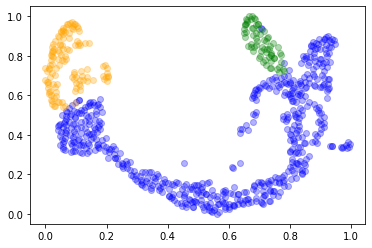

time: 101 ms (started: 2022-05-11 13:03:59 -05:00)


In [58]:
colors = ['blue', 'orange', 'green']
for i in cell_clusters:
    xy = np.array(cell_clusters[i])
    plt.scatter(xy[:,0],xy[:,1],c=colors[i], alpha=0.3)

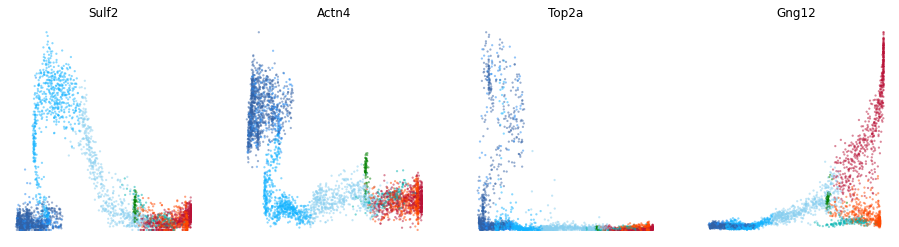

time: 4.13 s (started: 2022-05-11 14:05:08 -05:00)


In [73]:
# Show legend only
#_, ax = plt.subplots()
#cdplt.gene.scatter_gene(ax=ax,legend='only', colors=colormap.colormap_erythroid, s = 10, gene_name=None)
#ax.axis('off')
#plt.show()
gene_list=['Dcx','Rimbp2','Dctn3','Psd3','Ntrk2',
           'Pfkp','Gnao1','Ncald','Klf7','Slc4a10',
           'Nav1','Elavl4','Gpc6','Cdh13','Ppfia2']

gene_list=['Sulf2', 'Actn4', 'Top2a','Gng12']

ncols=5
fig = plt.figure(figsize=(20,4))


for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='pseudotime',
        y='spliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_pancreas,
        alpha=0.5, 
        s = 5,
        velocity=False,
        gene_name=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')


## Graph representation of the cell fates


In [248]:
#!conda install -c pyviz holoviews bokeh -y
%autoreload 2
import pandas as pd 
import numpy as np
import os
import networkx as nx

import datashader as ds
import datashader.transfer_functions as tf
from datashader.layout import forceatlas2_layout
from datashader.bundling import connect_edges, hammer_bundle
from celldancer.utilities import extract_from_df

time: 1.15 ms (started: 2022-05-04 10:19:06 -05:00)


In [468]:
def layout_graph(data, radius):
    def create_KNN_based_graph():
        from sklearn.neighbors import NearestNeighbors
        neigh = NearestNeighbors(radius = radius)
        neigh.fit(embedding_ds)
        nn_graph = neigh.radius_neighbors_graph(embedding_ds, mode='connectivity')
        nn_array = nn_graph.toarray()
   
        # nn_array is effectively the edge list
        # Keep track of cells of 0 timeshift.
        node_list = [(i, {'ptime': ptime_ds[i,0], 'cluster':clusters_ds[i]}) 
                     for i in range(len(embedding_ds))]
        
        dtime = ptime_ds[:,0] - ptime_ds
        INF = 1./np.min(np.abs(dtime[dtime != 0]))

        # upper triangle of the knn array (i<j and nn_array[i,j] = 1)
        edge_filter = np.triu(nn_array, k=1)
        (i,j) = np.where(edge_filter != 0)

        # for forcedirected layouts, 
        # edge length is positively correlated with weight.
        # hence 1/dtime here as the weight
        # Created for directed graph
        edge_list = list()
        for a,b,w in zip(i,j, dtime[i,j]):
            if w>0:
                edge_list.append((a, b, 1/w))
            elif w<0:
                edge_list.append((a, b, -1/w))
            else:
                #print(a,b)
                edge_list.append((a, b, INF))

        G = nx.Graph()
        G.add_nodes_from(node_list)
        G.add_weighted_edges_from(edge_list)

        return G
    
    
    embedding = extract_from_df(data, ['embedding1', 'embedding2'])
    sample_cells = load_cellDancer['velocity1'][:n_cells].dropna().index
    clusters = extract_from_df(data, ['clusters'])
    ptime = extract_from_df(data, ['pseudotime'])
    
    embedding_ds = embedding[sample_cells]
    ptime_ds = ptime[sample_cells]
    clusters_ds = clusters[sample_cells]

    G = create_KNN_based_graph()
    
    index = np.array(range(len(embedding_ds)), dtype=int)[:,None]
    
    # NOTE!!!
    # the third column of nodes df has to be "index"
    nodes = pd.DataFrame(np.hstack((index, embedding_ds, ptime_ds, clusters_ds)), 
                         columns=['name','x','y','ptime','clusters'])
    
    edges = pd.DataFrame([(i[0], i[1], G.edges[i]['weight']) for i in G.edges], 
                         columns=['source', 'target', 'weight'])   
    return G, nodes, edges


G, nodes, edges = layout_graph(load_cellDancer, 5)

time: 4.42 s (started: 2022-05-04 13:55:09 -05:00)


In [411]:
forcedirected = forceatlas2_layout(nodes[['name','clusters']], edges, weight='weight', iterations=200, seed=10)

time: 11.5 s (started: 2022-05-04 13:20:09 -05:00)


In [412]:
forcedirected['gene_name']='gene'

time: 1.19 ms (started: 2022-05-04 13:20:22 -05:00)


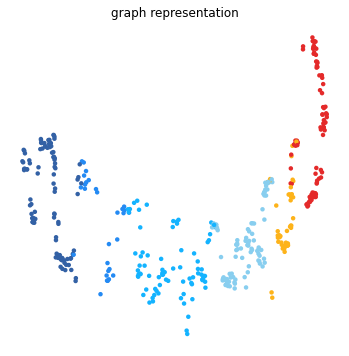

time: 55.1 ms (started: 2022-05-04 13:34:18 -05:00)


In [429]:
%autoreload 2

fig, ax = plt.subplots(figsize=(6,6))
cdplt.gene.scatter_gene(
    ax=ax,
    x='x',
    y='y',
    load_cellDancer=forcedirected,
    save_path=None,
    custom_xlim=None,
    custom_ylim=None,
    colors=colormap.colormap_erythroid,
    alpha=1, 
    s = 20,
    gene_name='gene')

ax.set_title('graph representation')
ax.axis('off')

plt.show()

In [249]:
def nodesplot(nodes, name=None, canvas=None, cat=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    aggregator=None if cat is None else ds.count_cat(cat)
    agg=canvas.points(nodes,'x','y',aggregator)
    return tf.spread(tf.shade(agg), px=1, name=name)

def edgesplot(edges, name=None, canvas=None):
    canvas = ds.Canvas(**cvsopts) if canvas is None else canvas
    return tf.shade(canvas.line(edges, 'x','y', agg=ds.count()), name=name)
    
def graphplot(nodes, edges, name="", canvas=None, cat=None):
    if canvas is None:
        xr = nodes.x.min(), nodes.x.max()
        yr = nodes.y.min(), nodes.y.max()
        canvas = ds.Canvas(**cvsopts)
        
    np = nodesplot(nodes, name + " nodes", canvas, cat)
    ep = edgesplot(edges, name + " edges", canvas)
    return tf.stack(ep, np, how="over", name=name)

time: 1.52 ms (started: 2022-05-04 10:32:10 -05:00)


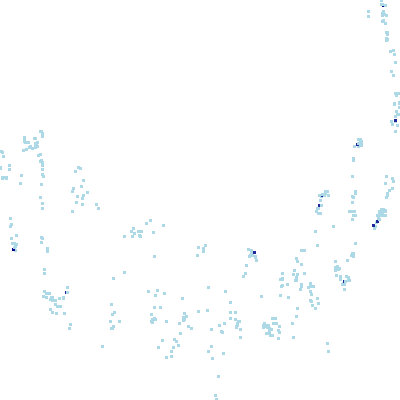

time: 43.1 ms (started: 2022-05-04 13:36:36 -05:00)


In [433]:
tf.Image(nodesplot(forcedirected))

In [428]:
from datashader.layout import circular_layout

circular  = circular_layout(nodes, uniform=False)
cd = circular
fd = forcedirected

%time cd_d = graphplot(cd, connect_edges(cd,edges), "Circular layout")
%time fd_d = graphplot(fd, connect_edges(fd,edges), "Force-directed") 
%time cd_b = graphplot(cd, hammer_bundle(cd,edges), "Circular layout, bundled")
%time fd_b = graphplot(fd, hammer_bundle(fd,edges), "Force-directed, bundled") 

tf.Images(cd_d,fd_d,cd_b,fd_b).cols(2)

CPU times: user 229 ms, sys: 6.68 ms, total: 236 ms
Wall time: 239 ms
CPU times: user 194 ms, sys: 1.73 ms, total: 196 ms
Wall time: 196 ms
Unexpected exception formatting exception. Falling back to standard exception
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/magics/execution.py", line 1316, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 1, in <module>
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/param/parameterized.py", line 3652, in __new__
    return inst.__call__(*args,**params)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/datashader/bundling.py", line 449, in __call__
    raise ImportError("hammer_bundle operation requires scikit-image. "
ImportError: hammer_bundle operation requires scikit-image. Ensure you install the dependency before applying bundling.

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 1982, in showtraceback
    stb = 

NameError: name 'cd_b' is not defined

time: 473 ms (started: 2022-05-04 13:33:44 -05:00)


In [515]:
graph = hv.Graph((edges, forcedirected))
graph.opts(node_size=3, edge_line_width=0.1,
            node_line_color='gray', 
            cmap='viridis', node_color='clusters',
            edge_alpha=0.1, node_alpha=1)

graph

:Graph   [source,target]   (weight)

time: 142 ms (started: 2022-05-04 14:24:18 -05:00)


In [520]:
graph.nodes.data

,name,clusters,x,y,gene_name
0,0,Haematoendothelial progenitors,0.340419,0.545222,gene
1,1,Blood progenitors 1,0.373622,0.542769,gene
2,2,Haematoendothelial progenitors,0.337277,0.555550,gene
3,3,Blood progenitors 2,0.411876,0.543565,gene
4,4,Blood progenitors 1,0.375207,0.547140,gene
...,...,...,...,...,...
438,438,Erythroid2,0.497215,0.548969,gene
439,439,Erythroid3,0.517539,0.571672,gene
440,440,Erythroid3,0.517891,0.572479,gene
441,441,Erythroid3,0.521142,0.570617,gene


time: 7.03 ms (started: 2022-05-04 14:27:13 -05:00)


In [524]:
help(forcedirected.rename)

Help on method rename in module pandas.core.frame:

rename(mapper: 'Renamer | None' = None, *, index: 'Renamer | None' = None, columns: 'Renamer | None' = None, axis: 'Axis | None' = None, copy: 'bool' = True, inplace: 'bool' = False, level: 'Level | None' = None, errors: 'str' = 'ignore') -> 'DataFrame | None' method of pandas.core.frame.DataFrame instance
    Alter axes labels.
    
    Function / dict values must be unique (1-to-1). Labels not contained in
    a dict / Series will be left as-is. Extra labels listed don't throw an
    error.
    
    See the :ref:`user guide <basics.rename>` for more.
    
    Parameters
    ----------
    mapper : dict-like or function
        Dict-like or function transformations to apply to
        that axis' values. Use either ``mapper`` and ``axis`` to
        specify the axis to target with ``mapper``, or ``index`` and
        ``columns``.
    index : dict-like or function
        Alternative to specifying axis (``mapper, axis=0``
        is eq

In [522]:
simple_graph.nodes.data

,x,y,index
0,1.000000e+00,0.000000e+00,0.0
1,7.071068e-01,7.071068e-01,1.0
2,6.123234e-17,1.000000e+00,2.0
3,-7.071068e-01,7.071068e-01,3.0
4,-1.000000e+00,1.224647e-16,4.0
5,-7.071068e-01,-7.071068e-01,5.0
6,-1.836970e-16,-1.000000e+00,6.0
7,7.071068e-01,-7.071068e-01,7.0


time: 5.43 ms (started: 2022-05-04 14:28:06 -05:00)


In [485]:
from holoviews.operation.datashader import datashade, bundle_graph
bundled = bundle_graph(graph)
bundled



Unexpected exception formatting exception. Falling back to standard exception
time: 26.7 ms (started: 2022-05-04 14:03:36 -05:00)


Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/2p/2j0f_d_13815dk9jyzwnfl540000gp/T/ipykernel_10860/2083552704.py", line 2, in <cell line: 2>
    bundled = bundle_graph(graph)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/param/parameterized.py", line 3652, in __new__
    return inst.__call__(*args,**params)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/operation.py", line 220, in __call__
    return element.apply(self, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/accessors.py", line 47, in pipelined_call
    result = __call__(*args, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/co

In [478]:
# %%
overlay = datashade(bundled, width=800, height=800) * bundled.select(pseudotime=(0,0.05))
overlay.opts(opts.Graph(node_size=10))

# %%
from bokeh.plotting import figure, output_notebook,reset_output, show
from bokeh.models import ColumnDataSource, Arrow, OpenHead, NormalHead, VeeHead

cds = ColumnDataSource(data=dict(x_start=[0,1, 2], y_start=[0,1, 2], x_end=[1,3, 5], y_end=[0,5, 8], line_width=[1]*3, color=['red','blue','yellow']))
arr = Arrow(end=NormalHead(), source=cds, line_color='color', line_width='line_width', x_start='x_start', y_start='y_start', x_end='x_end', y_end='y_end')



NameError: name 'bundled' is not defined

time: 10.6 ms (started: 2022-05-04 14:00:46 -05:00)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
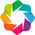

Unexpected exception formatting exception. Falling back to standard exception
time: 1.9 s (started: 2022-05-04 13:59:45 -05:00)


Traceback (most recent call last):
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/2p/2j0f_d_13815dk9jyzwnfl540000gp/T/ipykernel_10860/352489477.py", line 10, in <cell line: 10>
    layout_nodes(graph, layout=nx.spring_layout,
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/param/parameterized.py", line 3652, in __new__
    return inst.__call__(*args,**params)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/operation.py", line 220, in __call__
    return element.apply(self, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packages/holoviews/core/accessors.py", line 47, in pipelined_call
    result = __call__(*args, **kwargs)
  File "/Users/pengzhizhang/miniconda3/envs/celldancer/lib/python3.9/site-packa

In [477]:

# %%
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

kwargs = dict(width=1000, height=1000, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))
# %%
from holoviews.element.graphs import layout_nodes
layout_nodes(graph, layout=nx.spring_layout, 
             kwargs={'weight':'weight', 'iterations':200, 'seed':100})


In [493]:
# Declare abstract edges
N = 8
node_indices = np.arange(N)
source = np.zeros(N)
target = node_indices

simple_graph = hv.Graph(((source, target),))
simple_graph
# Node info
np.random.seed(7)
x, y = simple_graph.nodes.array([0, 1]).T
node_labels = ['Output']+['Input']*(N-1)
edge_weights = np.random.rand(8)

# Declare Graph
nodes = hv.Nodes((x, y, node_indices, node_labels), vdims='Type')
graph = hv.Graph(((source, target, edge_weights), nodes, paths), vdims='Weight')

graph.opts(node_color='Type', edge_color='Weight', cmap=['blue', 'red'], edge_cmap='viridis')

:Graph   [start,end]   (Weight)

time: 137 ms (started: 2022-05-04 14:15:49 -05:00)


In [511]:
simple_graph.nodes.dimensions()

[Dimension('x'), Dimension('y'), Dimension('index')]

time: 2.17 ms (started: 2022-05-04 14:23:08 -05:00)
